In [72]:
# Set global utool flags
import utool as ut
ut.util_io.__PRINT_WRITES__ = False
ut.util_io.__PRINT_READS__ = False
ut.util_parallel.__FORCE_SERIAL__ = True
ut.util_cache.VERBOSE_CACHE = False
ut.NOT_QUIET = False

# Matplotlib stuff
%pylab inline
%load_ext autoreload
%autoreload

# Define database for this test run
import ibeis
db = 'PZ_Master1'
#db = 'seals2'
#db = 'GZ_ALL'
#db = 'NNP_MasterGIRM_core'
 
# Setup database specific configs
if db == 'PZ_MTEST' or db == 'GZ_ALL':
    separability_annot_cfgs = ['ctrl']
else:
    separability_annot_cfgs = ['timequalctrl']

if db == 'PZ_Master1':
    varysize = ['varysize_pzm']
    varypername = ['varypername_pzm']
elif db == 'GZ_ALL':
    varysize = ['varysize_gz']
    varypername = ['varypername_gz']
elif db == 'NNP_MasterGIRM_core':
    varysize = ['varysize_girm']
    varypername = ['varypername_girm']

Populating the interactive namespace from numpy and matplotlib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Database Information

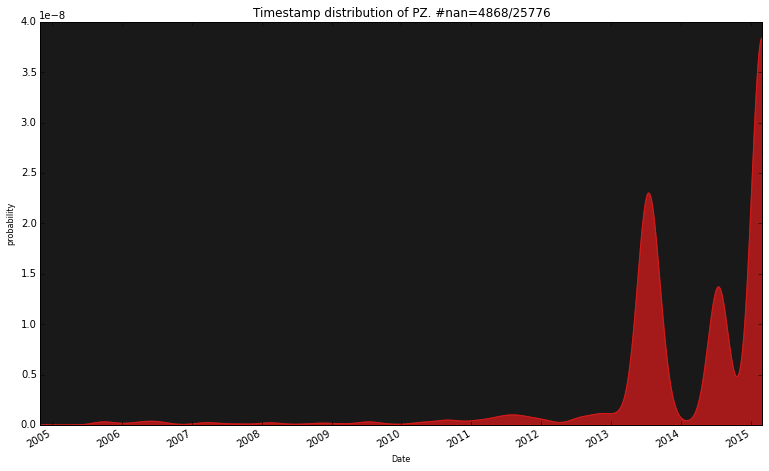

In [73]:
import ibeis
ibs = ibeis.opendb(db=db)
ibeis.other.dbinfo.show_image_time_distributions(ibs, ibs.get_valid_gids())

In [74]:
_ = ibeis.other.dbinfo.get_dbinfo(ibs)

Filtered 30 names
Filtered 13234 images
Filtered 0 annots
Checking Image Info
Checking Name Info
Checking Annot Species
Checking Multiton/Singleton Species
Checking Annot Info
Building Stats String
Checking Other Annot Stats
Checking Contrib Stats
Summarizing
Check asserts
[dbinfo]+============================
[dbinfo]+ singleton := single sighting
[dbinfo]+ multiton  := multiple sightings
[dbinfo]----------
[dbinfo]DB Info:  PZ_Master1
[dbinfo]DB Notes: None
[dbinfo]DB NumContrib: 71
[dbinfo]----------
[dbinfo]# Names                      = 6756
[dbinfo]# Names (unassociated)       = 0
[dbinfo]# Names (singleton)          = 5176
[dbinfo]# Names (multiton)           = 1580
[dbinfo]----------
[dbinfo]# Annots                     = 17364
[dbinfo]# Annots (unknown)           = 3919
[dbinfo]# Annots (singleton)         = 5176
[dbinfo]# Annots (multiton)          = 8269
[dbinfo]----------
[dbinfo]# Annots per Name (multiton) = {
[dbinfo]    'max'   : 33,
[dbinfo]    'min'   : 2,
[dbinfo]   

# Detection Summary

[0, 1, 2, 3, 4]
drawing image    1/5...  rate=1.24 Hz, etr: 0:00:03, ellapsed: 0:00:00, wall: 17:16 EST
drawing image    2/5...  rate=1.42 Hz, etr: 0:00:02, ellapsed: 0:00:01, wall: 17:16 EST
drawing image    3/5...  rate=4.28 Hz, etr: 0:00:00, ellapsed: 0:00:01, wall: 17:16 EST
drawing image    4/5...  rate=1.18 Hz, etr: 0:00:00, ellapsed: 0:00:02, wall: 17:16 EST
drawing image    5/5...  rate=1.29 Hz, etr: 0:00:00, ellapsed: 0:00:03, wall: 17:17 EST


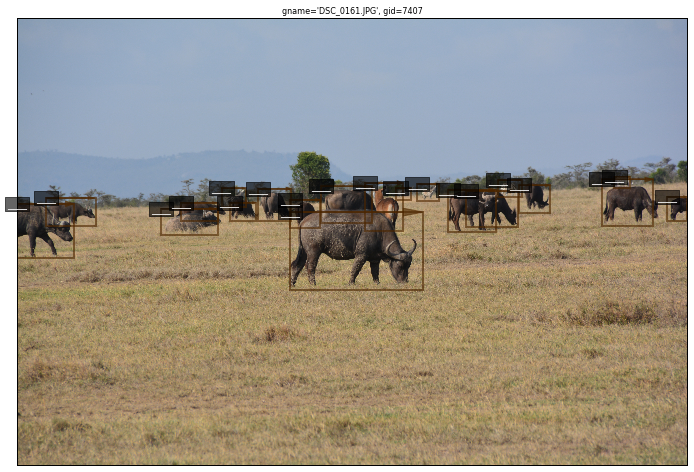

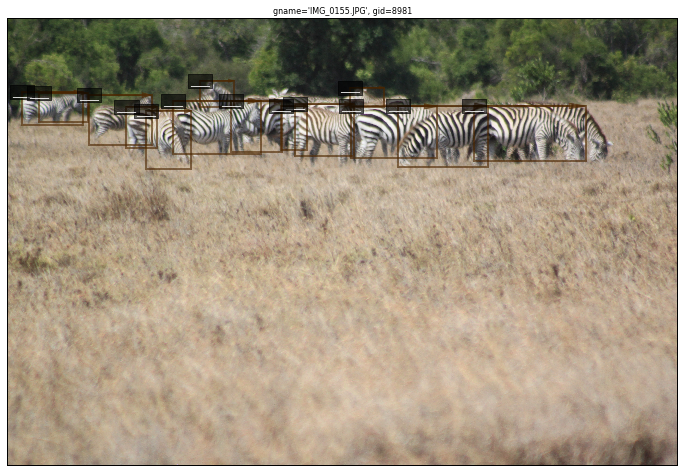

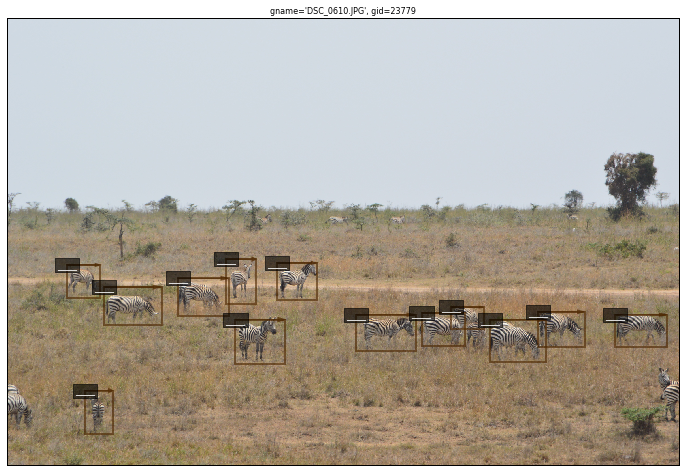

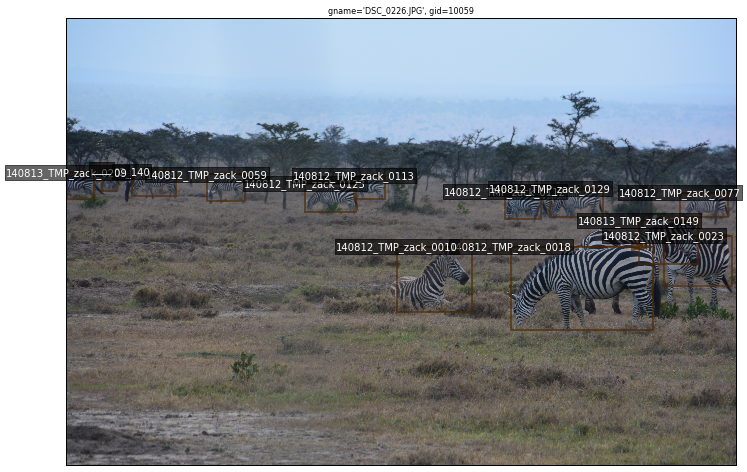

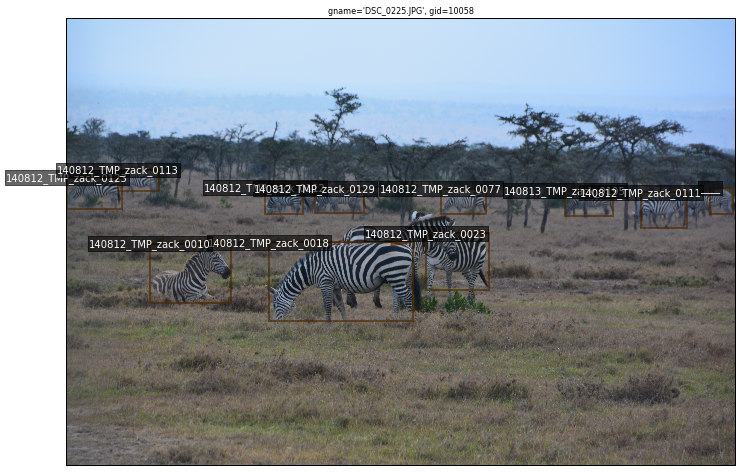

In [96]:
# Get a sample of images
gids = ibs.get_valid_gids()
nAids_list = list(map(len, aids))
gids_sorted = ut.sortedby(gids, nAids_list)[::-1]
samplex = list(range(5))
print(samplex)
gids_sample = ut.list_take(gids_sorted, samplex)

import ibeis.viz
for gid in ut.ProgressIter(gids_sample, lbl='drawing image'):
    ibeis.viz.show_image(ibs, gid)

# Identification Summary

### Identification Accuracy
The uncontrolled
The baseline pipeline configuration is: 

Equivalent Command Line:
ibeis -e rank_cdf --db PZ_Master1 -a unctrl ctrl -t baseline --show
argspec = ArgSpec(args=['ibs', 'test_result', 'verbose', 'test_cfgx_slice'], varargs=None, keywords=None, defaults=(False, None))


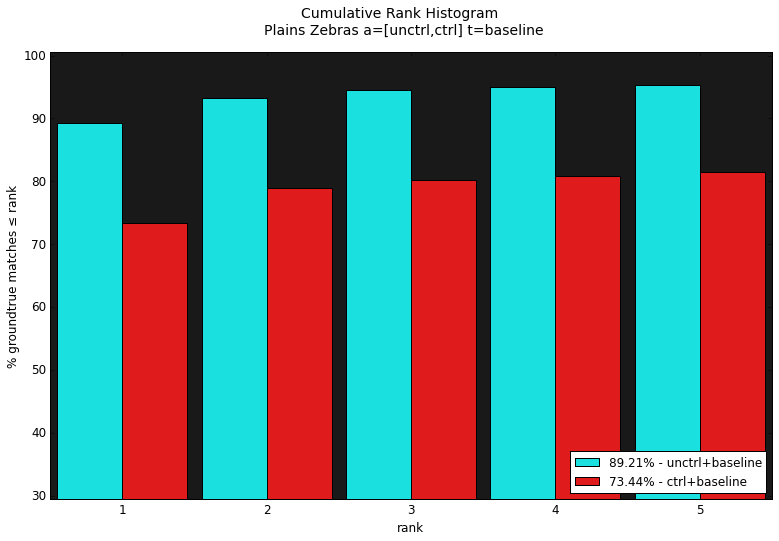

In [76]:
test_result = ibeis.run_experiment(
    e='rank_cdf', 
    db=db, 
    a=['unctrl', 'ctrl'],
    t=['baseline'])
#test_result.print_unique_annot_config_stats()
_ = test_result.draw_func()

### Distribution of Correct Matches (True Positives) over timedelta categories

Equivalent Command Line:
ibeis -e timedelta_hist --db PZ_Master1 -a unctrl ctrl -t baseline --show
argspec = ArgSpec(args=['ibs', 'test_result', 'falsepos', 'truepos', 'verbose'], varargs=None, keywords=None, defaults=(None, None, False))


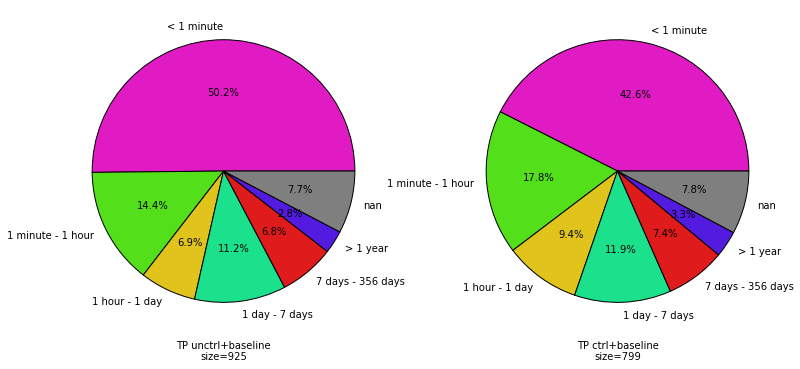

In [77]:
test_result = ibeis.run_experiment(
    e='timedelta_hist',
    db=db, 
    a=['unctrl', 'ctrl'],
    t=['baseline'],
    truepos=True)
test_result.draw_func()

### Distribution of Incorrect Matches (False Positives) over timedelta categories

Equivalent Command Line:
ibeis -e timedelta_hist --db PZ_Master1 -a unctrl ctrl -t baseline --show
argspec = ArgSpec(args=['ibs', 'test_result', 'falsepos', 'truepos', 'verbose'], varargs=None, keywords=None, defaults=(None, None, False))


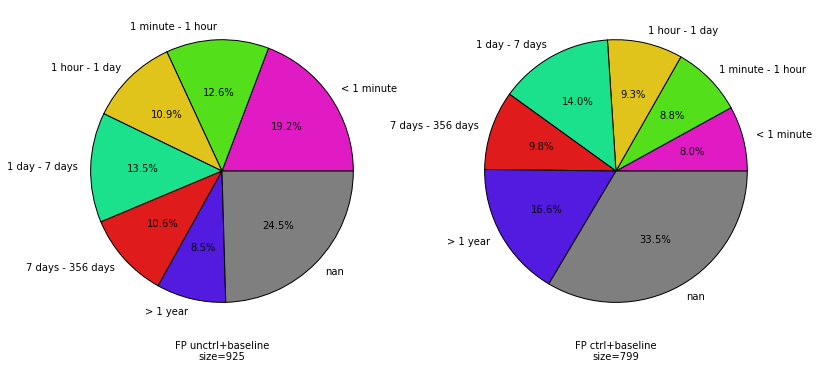

In [78]:
# Baseline Timedeltas FP
test_result = ibeis.run_experiment(
    e='timedelta_hist',
    db=db, 
    a=['unctrl', 'ctrl'],
    t=['baseline'],
    falsepos=True)
test_result.draw_func()

# Identification using different pipeline configuration
This test varies the feature invariance used in the identification algorithm


Equivalent Command Line:
ibeis -e rank_cdf --db PZ_Master1 -a ctrl -t invar4 --show
argspec = ArgSpec(args=['ibs', 'test_result', 'verbose', 'test_cfgx_slice'], varargs=None, keywords=None, defaults=(False, None))


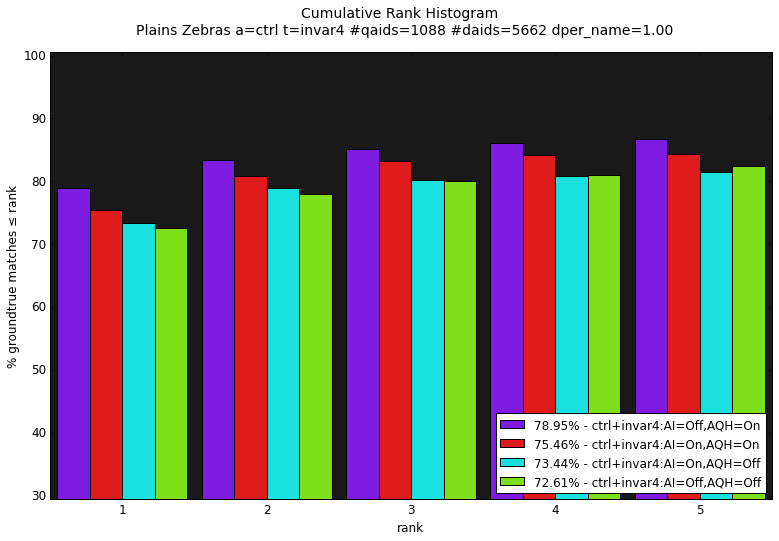

In [79]:
test_result = ibeis.run_experiment(
    e='rank_cdf',
    db=db, 
    a=['ctrl'], 
    t=['invar4'])
test_result.draw_func()

# Score Separability Experiments
These plots show the distribution of identification scores for groundtrue (correct) and groundfalse (incorrect) matches

In [80]:
a = separability_annot_cfgs
t = ['invarbest']

## Scores of Success Cases

Equivalent Command Line:
ibeis -e scores --db PZ_Master1 -a timequalctrl -t invarbest -f :fail=False,min_gf_timedelta=None --show
argspec = ArgSpec(args=['ibs', 'test_result', 'f'], varargs=None, keywords=None, defaults=(None,))


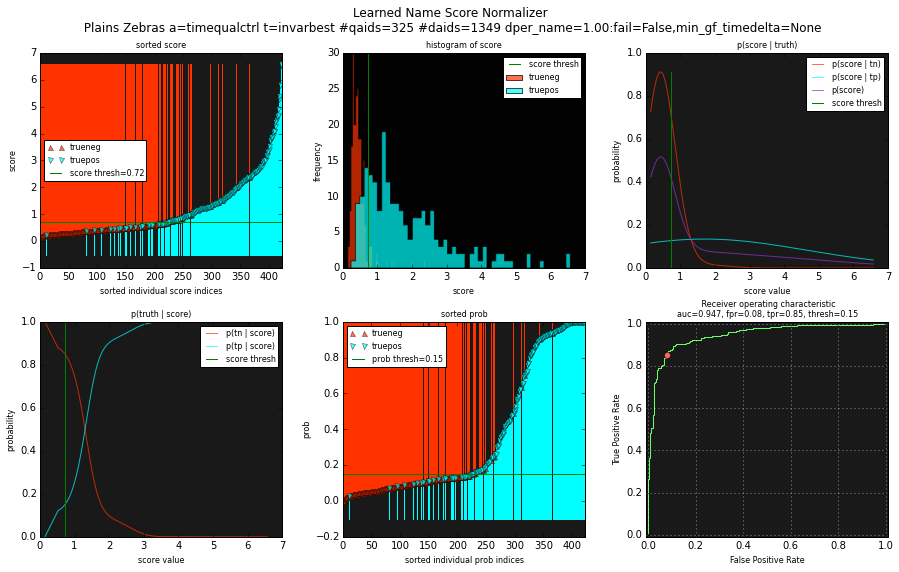

In [81]:
test_result = ibeis.run_experiment(
    e='scores',
    db=db, 
    a=a, 
    t=t,
    f=[':fail=False,min_gf_timedelta=None'],
)
_ = test_result.draw_func()

## Scores of All Cases

Equivalent Command Line:
ibeis -e scores --db PZ_Master1 -a timequalctrl -t invarbest -f :fail=None,min_gf_timedelta=None --show
argspec = ArgSpec(args=['ibs', 'test_result', 'f'], varargs=None, keywords=None, defaults=(None,))


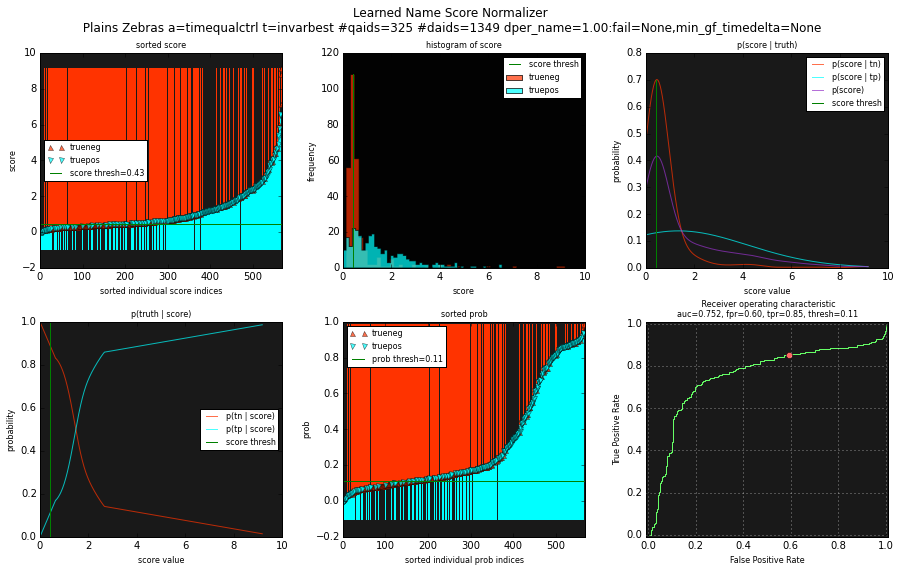

In [82]:
# Score Seperability with NO FILTERING
test_result = ibeis.run_experiment(
    e='scores',
    db=db, 
    a=a, 
    t=t,
    f=[':fail=None,min_gf_timedelta=None']
)
_ = test_result.draw_func()

------------------

# Individual Results 
* Higher scores are on the Left
* Groundtrue matches have a green border

In [83]:
t = ['invarbest']
a = separability_annot_cfgs
draw_case_kw = dict(show_in_notebook=True, annot_modes=[0, 1])

### Highest Scoring Success Cases

Equivalent Command Line:
ibeis -e draw_cases --db PZ_Master1 -a timequalctrl -t invarbest -f :fail=False,min_gf_timedelta=12h,index=0:2,orderby=gtscore,reverse=True,without_gf_tag=Photobomb --show
argspec = ArgSpec(args=['ibs', 'test_result', 'metadata', 'f', 'show_in_notebook', 'annot_modes'], varargs=None, keywords=None, defaults=(None, None, True, None))
Taking index sample from len(qx_list) = 134
nointeract:     1/2...  rate=0.44 Hz, etr: 0:00:02, ellapsed: 0:00:02, wall: 17:04 EST
nointeract:     2/2...  rate=0.54 Hz, etr: 0:00:00, ellapsed: 0:00:04, wall: 17:04 EST


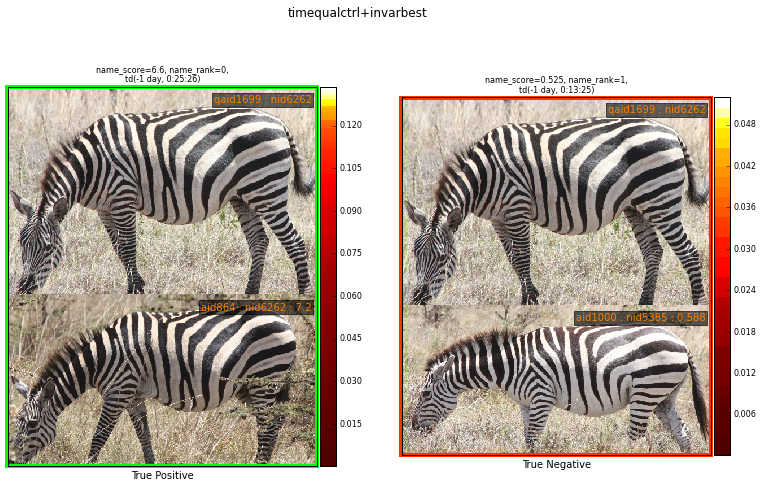

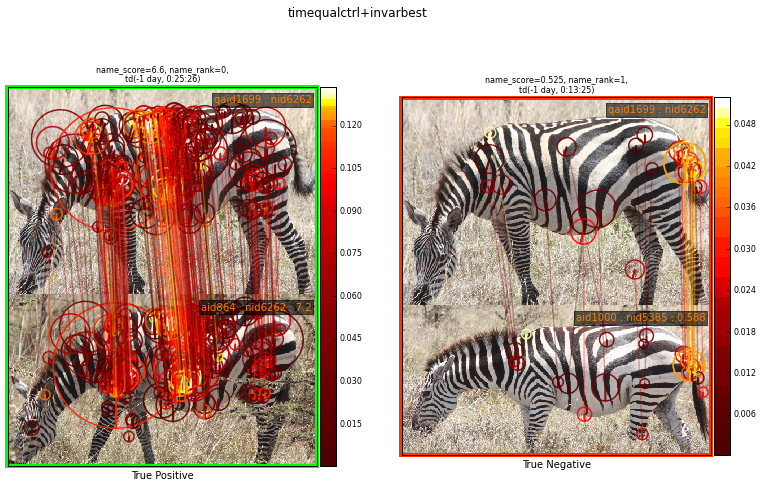

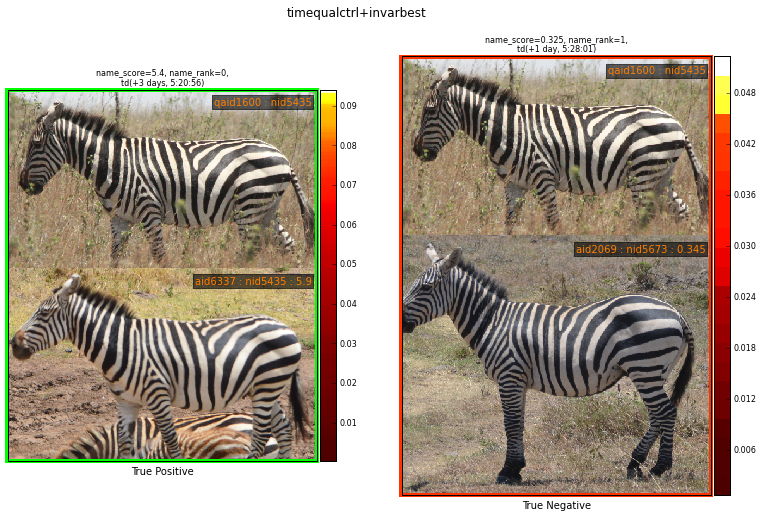

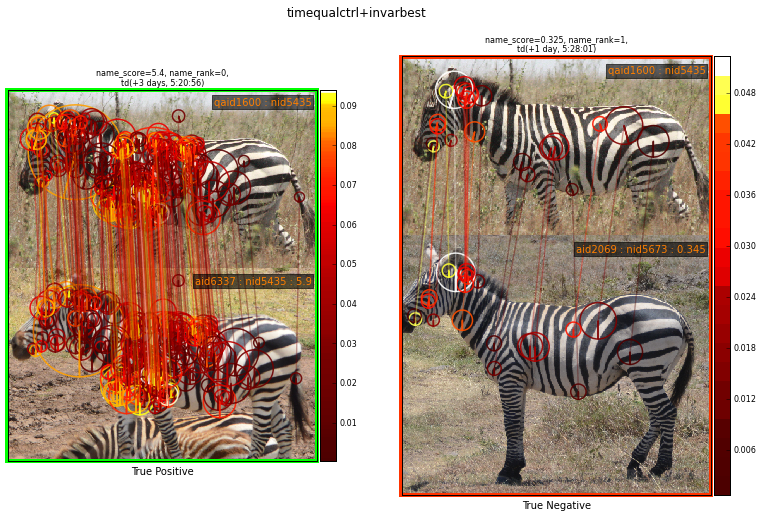

In [84]:
test_result = ibeis.run_experiment(
    e='draw_cases',
    db=db, 
    a=a, 
    t=t,
    f=[':fail=False,min_gf_timedelta=12h,index=0:2,orderby=gtscore,reverse=True,without_gf_tag=Photobomb'],
    **draw_case_kw)
_ = test_result.draw_func()

### Failure Cases (sorted by groundtrue score)

Equivalent Command Line:
ibeis -e draw_cases --db PZ_Master1 -a timequalctrl -t invarbest -f :fail=True,min_gf_timedelta=12h,index=0:3,orderby=gtscore,reverse=True --show
argspec = ArgSpec(args=['ibs', 'test_result', 'metadata', 'f', 'show_in_notebook', 'annot_modes'], varargs=None, keywords=None, defaults=(None, None, True, None))
Taking index sample from len(qx_list) = 27
nointeract:     1/3...  rate=0.58 Hz, etr: 0:00:03, ellapsed: 0:00:01, wall: 17:04 EST
nointeract:     2/3...  rate=0.62 Hz, etr: 0:00:01, ellapsed: 0:00:03, wall: 17:04 EST
nointeract:     3/3...  rate=0.61 Hz, etr: 0:00:00, ellapsed: 0:00:04, wall: 17:04 EST


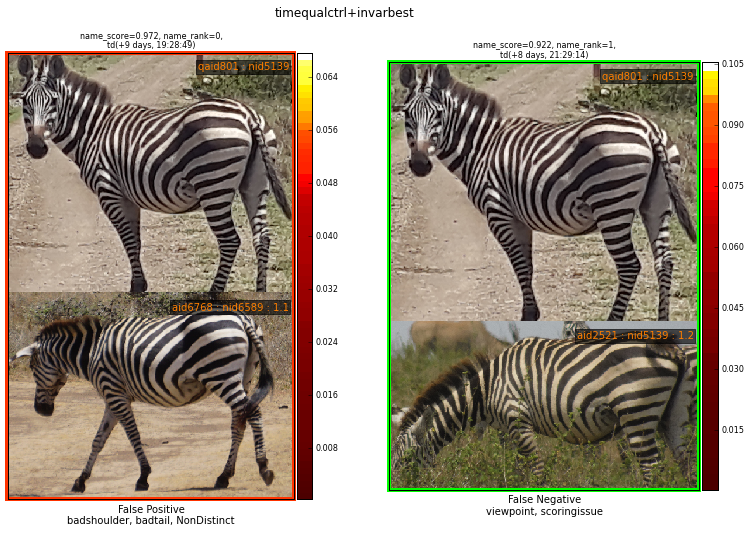

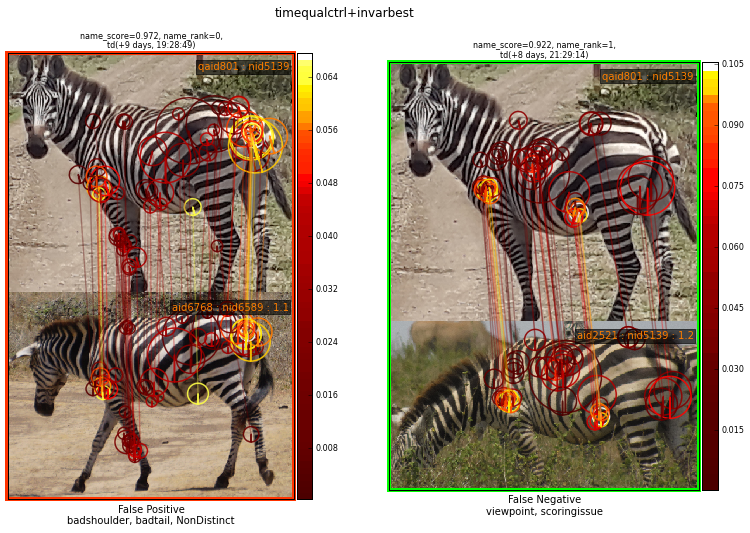

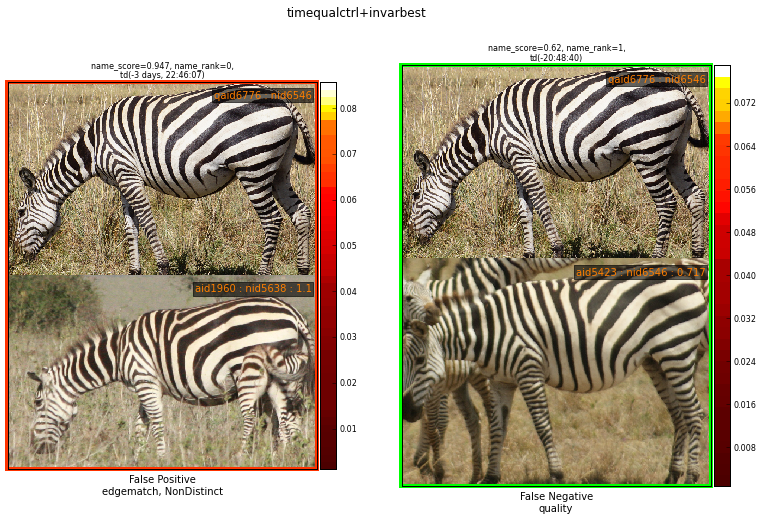

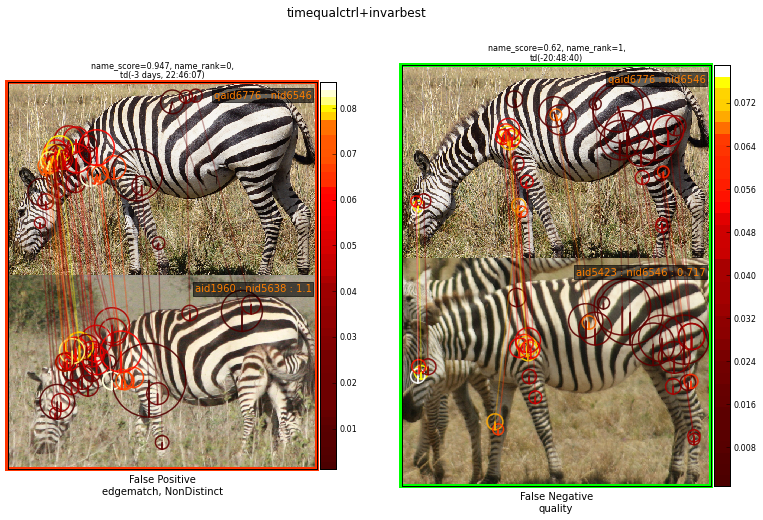

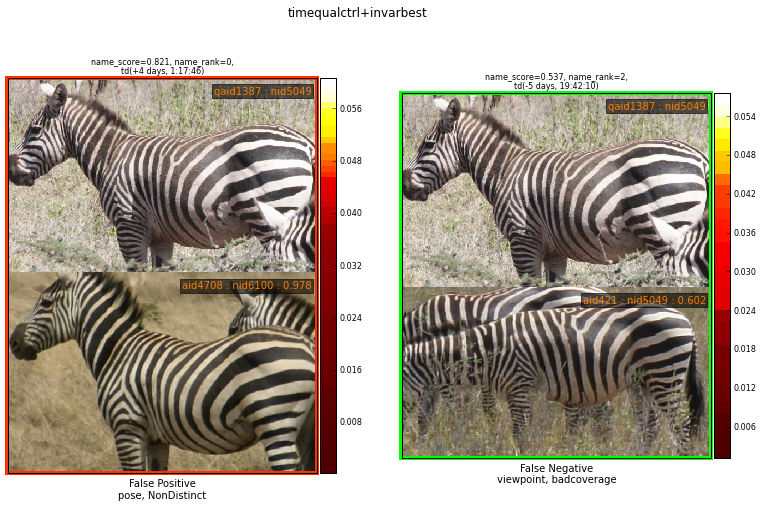

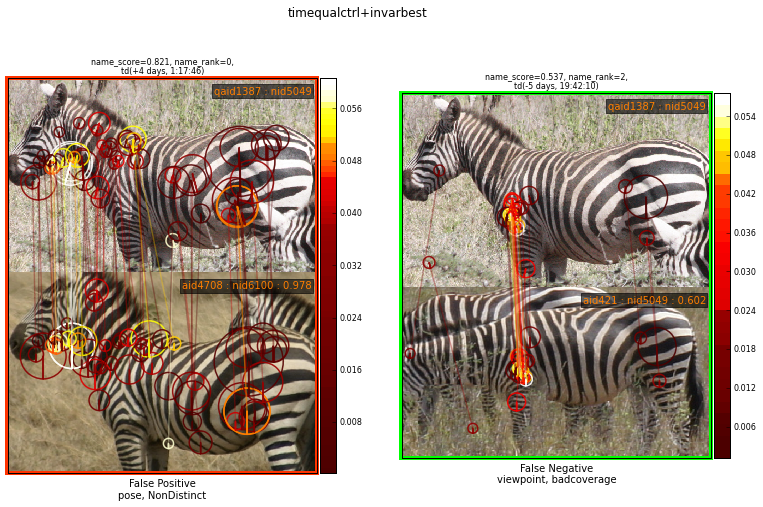

In [85]:
test_result = ibeis.run_experiment(
    e='draw_cases',
    db=db, 
    a=a, 
    t=t,
    f=[':fail=True,min_gf_timedelta=12h,index=0:3,orderby=gtscore,reverse=True'],
    **draw_case_kw)
_ = test_result.draw_func()

### Failure Cases (sorted by groundfalse score) 

Equivalent Command Line:
ibeis -e draw_cases --db PZ_Master1 -a timequalctrl -t invarbest -f :fail=True,min_gf_timedelta=12h,index=0:3,orderby=gfscore,reverse=True --show
argspec = ArgSpec(args=['ibs', 'test_result', 'metadata', 'f', 'show_in_notebook', 'annot_modes'], varargs=None, keywords=None, defaults=(None, None, True, None))
Taking index sample from len(qx_list) = 27
nointeract:     1/3...  rate=0.52 Hz, etr: 0:00:03, ellapsed: 0:00:01, wall: 17:04 EST
nointeract:     2/3...  rate=0.57 Hz, etr: 0:00:01, ellapsed: 0:00:03, wall: 17:04 EST
nointeract:     3/3...  rate=0.65 Hz, etr: 0:00:00, ellapsed: 0:00:05, wall: 17:04 EST


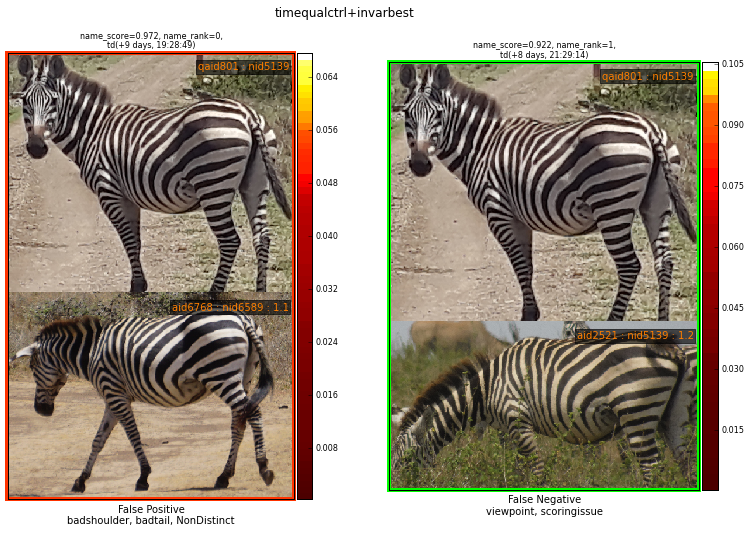

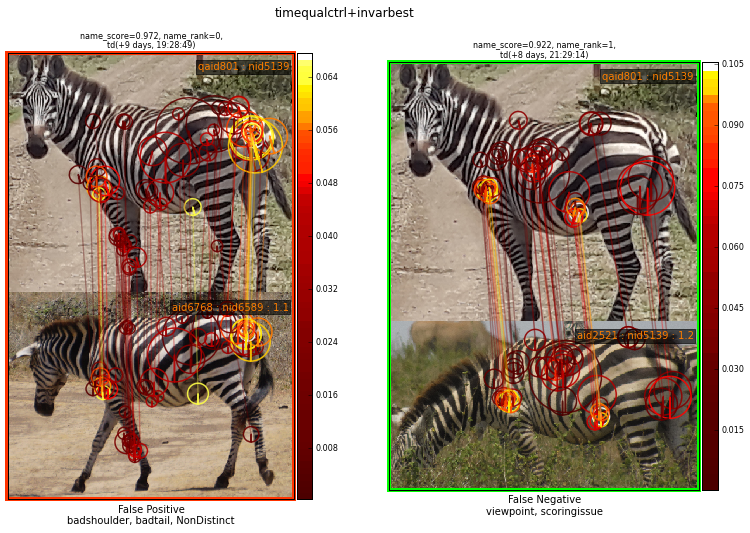

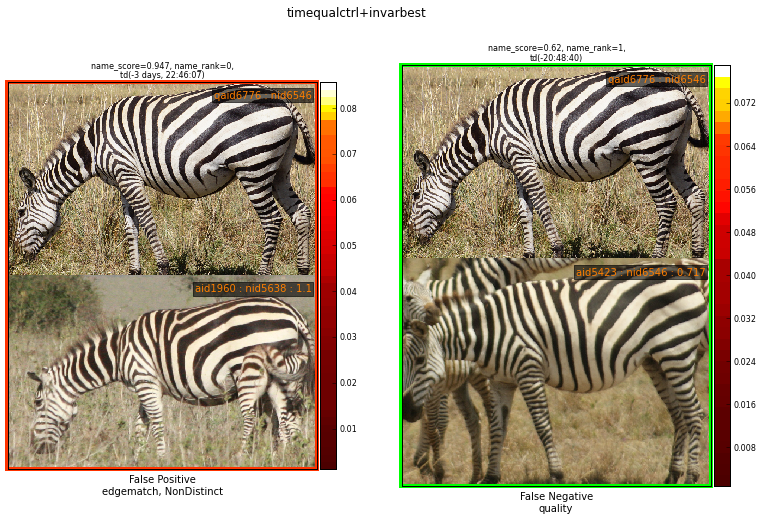

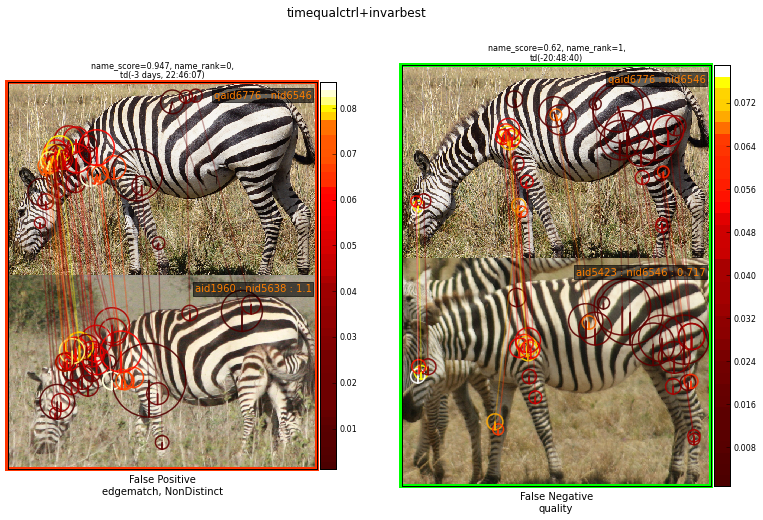

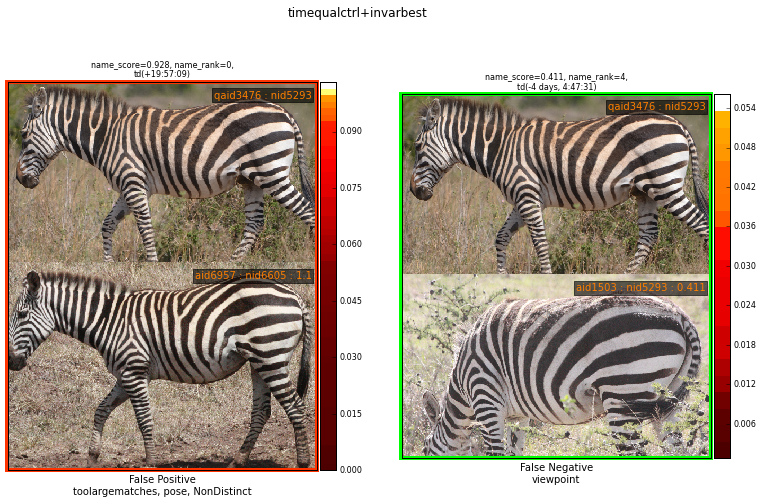

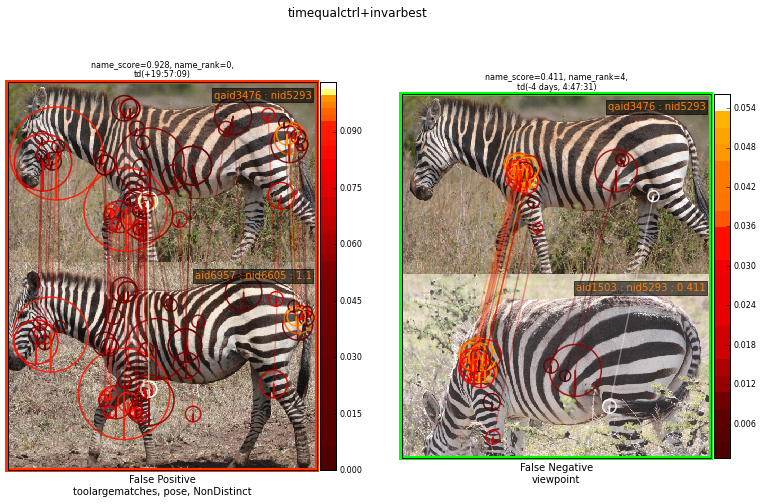

In [86]:
test_result = ibeis.run_experiment(
    e='draw_cases',
    db=db, 
    a=a, 
    t=t,
    f=[':fail=True,min_gf_timedelta=12h,index=0:3,orderby=gfscore,reverse=True'],
    **draw_case_kw)
_ = test_result.draw_func()